In [3]:
library("Matrix")
library(Seurat)
library(DT)
library(dplyr)
library(here)
library(ggplot2)
library(mclust)
library(cowplot)
library(tidyverse)
library(reshape)
library(SingleR)
library(annotate)
library("org.Mm.eg.db")
library(biomaRt)
library(scCustomize)
library(future)
library(ggnewscale)
library(furrr)
library(readxl)
library(STACAS)
library(patchwork)

rank_score_func <- function(df){

df <- df %>% mutate(score = -1*log(p_val_adj+(10^-310))*avg_logFC*(pct.1/(pct.2+10^-300)))

return(df)
}

convertHumanGeneList <- function(x){

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

genesV2 = getLDS(attributes = c("hgnc_symbol"), filters = "hgnc_symbol", values = x , mart = human, attributesL = c("mgi_symbol"), martL = mouse, uniqueRows=T)

humanx <- unique(genesV2[, 2])

# Print the first 6 genes found to the screen
print(head(humanx))
return(humanx)
}

library("remotes")
library("fs")

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 10),
    axis.title = element_text(size = 10),
      plot.title = element_text(size = 10),
    text = element_text(size = 10, colour = "black"),
    legend.text = element_text(size = 10),
    legend.key.size =  unit(10, units = "points")
    
  )
}

mid.se <- celldex::MonacoImmuneData();

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache



# All diabetes data - new and old

## CD8 new

In [25]:
paths  <- list.files("data/rawdata/", full.names = T)

In [26]:
paths

[1] "data/rawdata//exp08_init_with_Mixcr.rds"      
 [2] "data/rawdata//exp10_init_with_Mixcr.rds"      
 [3] "data/rawdata//exp11_W1_init_with_Mixcr.rds"   
 [4] "data/rawdata//exp11_W2_init_with_Mixcr.rds"   
 [5] "data/rawdata//exp16_CD4_A_init_with_Mixcr.rds"
 [6] "data/rawdata//exp16_CD4_B_init_with_Mixcr.rds"
 [7] "data/rawdata//exp16_CD8_A_init_with_Mixcr.rds"
 [8] "data/rawdata//exp16_CD8_B_init_with_Mixcr.rds"
 [9] "data/rawdata//exp18_1_init_with_Mixcr.rds"    
[10] "data/rawdata//exp18_2_init_with_Mixcr.rds"    
[11] "data/rawdata//exp18_3_init_with_Mixcr.rds"    
[12] "data/rawdata//exp18_4_init_with_Mixcr.rds"    
[13] "data/rawdata//exp19_1_init_with_Mixcr.rds"    
[14] "data/rawdata//exp19_2_init_with_Mixcr.rds"    
[15] "data/rawdata//exp19_3_init_with_Mixcr.rds"    
[16] "data/rawdata//exp19_4_init_with_Mixcr.rds"    
[17] "data/rawdata//exp20_1_init_with_Mixcr.rds"    
[18] "data/rawdata//exp20_2_init_with_Mixcr.rds"    
[19] "data/rawdata//exp20_3_init_with_Mixcr.rds"    
[20] "data/rawdata//exp20_4_init_with_Mixcr.rds"

In [27]:
seu_list  <- map(paths[c(1,2,3,7,8,9,11,13,15,17,19)], readRDS)

In [28]:
seu_list[[2]]$hashtags  %>% table

.
 H1 H10  H2  H3  H4  H5  H6  H7  H8  H9 
743 831 821 762 825 695 821 761 787 802 

In [29]:
exp10_cd8  <- subset(seu_list[[2]], hashtags == "H5")

In [30]:
seu_list[[2]] <- exp10_cd8

In [31]:
new_dia_cd8  <- scCustomize::Merge_Seurat_List(seu_list)

Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


In [32]:
new_dia_cd8

An object of class Seurat 
15166 features across 111682 samples within 3 assays 
Active assay: RNA (15152 features, 0 variable features)
 2 other assays present: Antibodies, PTPRC

In [33]:
options(future.globals.maxSize = 10000 * 1024^2)
plan("sequential")

### Remove problematic Patient 206

In [34]:
new_dia_cd8  <- subset(new_dia_cd8, Patient_ID != "206")

In [35]:
DefaultAssay(new_dia_cd8)  <- "RNA"
new_dia_cd8 <- NormalizeData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- ScaleData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- FindVariableFeatures(new_dia_cd8, nfeatures = 1000, verbose = FALSE)
new_dia_cd8 <- RunPCA(new_dia_cd8, npcs = 12, verbose = FALSE)
new_dia_cd8 <- RunUMAP(new_dia_cd8, reduction = "pca", dims = 1:12)

17:03:26 UMAP embedding parameters a = 0.9922 b = 1.112

17:03:26 Read 110969 rows and found 12 numeric columns

17:03:26 Using Annoy for neighbor search, n_neighbors = 30

17:03:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:03:36 Writing NN index file to temp file /var/tmp/pbs.18216721.meta-pbs.metacentrum.cz/Rtmp6u5dBp/fileab06a7a23cfd4

17:03:36 Searching Annoy index using 1 thread, search_k = 3000

17:04:23 Annoy recall = 100%

17:04:25 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:04:29 Initializing from normalized Laplacian + noise (using irlba)

17:04:32 Commencing optimization for 200 epochs, with 4702666 positive edges

17:05:10 Optimization finished



In [36]:
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 110969
Number of edges: 2904908

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8594
Number of communities: 23
Elapsed time: 57 seconds


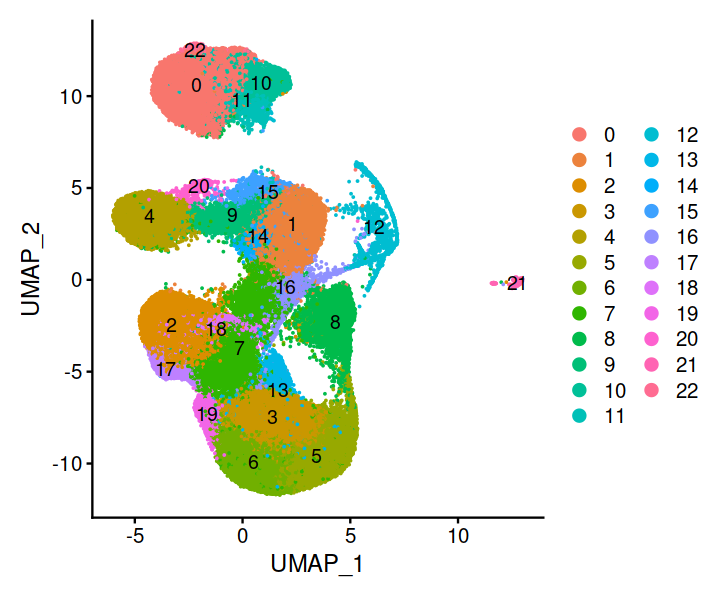

In [37]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_cd8, label = T, raster = F)

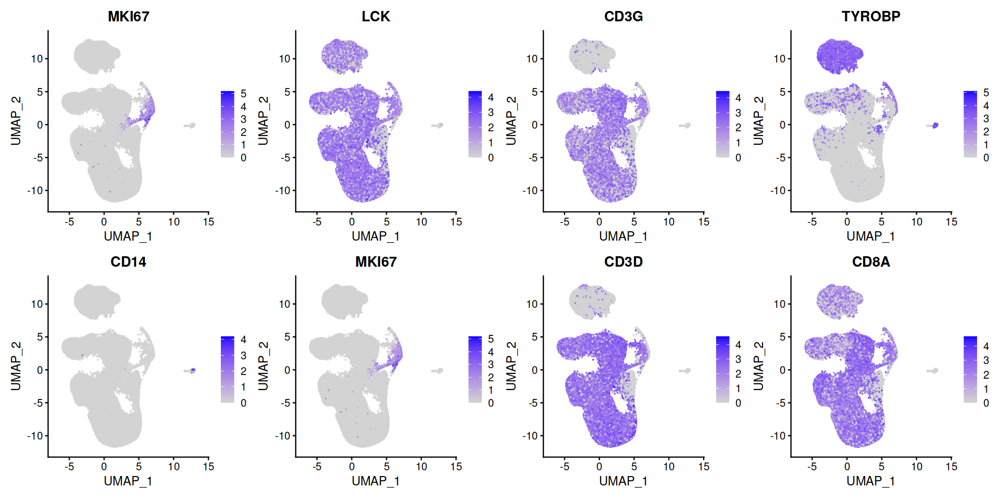

In [38]:
options(repr.plot.width = 16, repr.plot.height = 8)
FeaturePlot(new_dia_cd8, features = c("MKI67", "LCK", "CD3G", "TYROBP", "CD14", "MKI67", "CD3D", "CD8A"), ncol = 4, raster = F)

### Automated annotation of cell types

In [39]:
library(Azimuth)
mid.se <- celldex::MonacoImmuneData()
hpca.se  <- celldex::HumanPrimaryCellAtlasData()
load("data/ref_wherry_new.RData")

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache



In [40]:
annotate_tcell_data  <- function(seurat_dataset){
    
    ## This function annotates a Seurat object with three annotations:
    ## 1. Monaco Immune dataset annotations
    ## 2. Annotations based on bulk RNAseq from Giles et al, 2022
    ## 3. Azimuth annotations
        
    DefaultAssay(seurat_dataset)  <- "RNA"
	
    ### Annotate the dataset with Monaco Immune dataset
		pred.singler <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = mid.se, assay.type.test=1,
		labels = mid.se$label.fine, fine.tune = F)
    
	### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = ref_wherry_new$matrix,
		labels = ref_wherry_new$labels, fine.tune = F)

    	### Annotate the dataset with Wherry dataset
        pred.singler3 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = hpca.se,
		assay.type.test=1,
		labels = hpca.se$label.fine, fine.tune = F)

		all_labels <- data.frame(
		Monaco_single = pred.singler$labels,
		HPCA_single = pred.singler3$labels,
		Wherry_main = pred.singler2$labels,
		barcode = colnames(seurat_dataset))
		
		md2 <- seurat_dataset@meta.data
		md2$barcode = colnames(seurat_dataset)

		md3 <- left_join(md2, all_labels)

		seurat_dataset@meta.data <- md3
		rownames(seurat_dataset@meta.data) <- colnames(seurat_dataset)
		
	### Annotate the dataset with Azimuth
		
		seurat_dataset <- RunAzimuth(seurat_dataset, reference = "pbmcref")
		return(seurat_dataset)
	}


new_dia_cd8  <- annotate_tcell_data(new_dia_cd8)

Joining with `by = join_by(barcode)`


An AzimuthData object - reference version: 1.0.0 
Contains 3 meta.data field(s) to transfer.

Warning message:
"Overwriting miscellanous data for model"
detected inputs from HUMAN with id type Gene.name

reference rownames detected HUMAN with id type Gene.name

Using reference SCTModel to calculate pearson residuals

Determine variable features

Setting min_variance to:  -Inf

Calculating residuals of type pearson for 3901 genes



  |======================================================================| 100%


Set default assay to refAssay

Normalizing query using reference SCT model

Projecting cell embeddings

Finding query neighbors

Finding neighborhoods

Finding anchors

	Found 9110 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to p

In [41]:
saveRDS(new_dia_cd8, "data/processed/cd8_full.rds")

In [2]:
new_dia_cd8  <- readRDS("data/processed/cd8_full.rds")

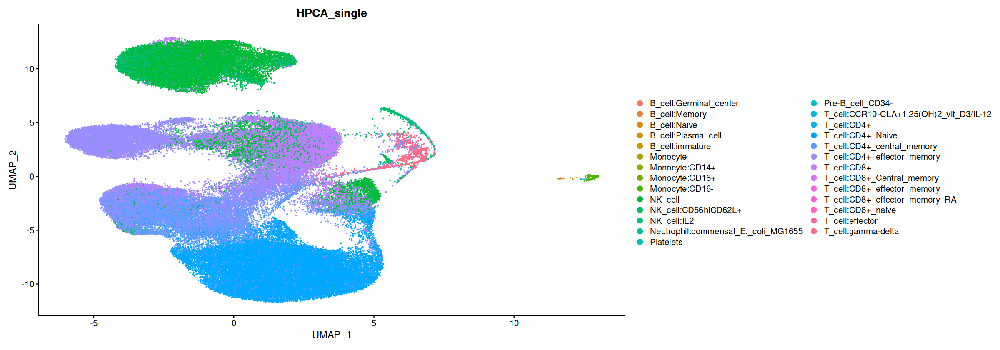

In [3]:
options(repr.plot.width = 20, repr.plot.height = 7)

DimPlot(new_dia_cd8, raster = F, group.by = "HPCA_single", label = F)

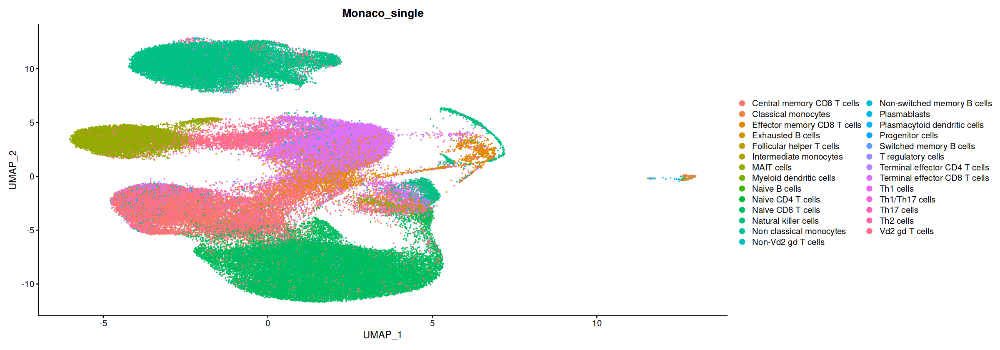

In [4]:
DimPlot(new_dia_cd8, raster = F, group.by = "Monaco_single", label = F)

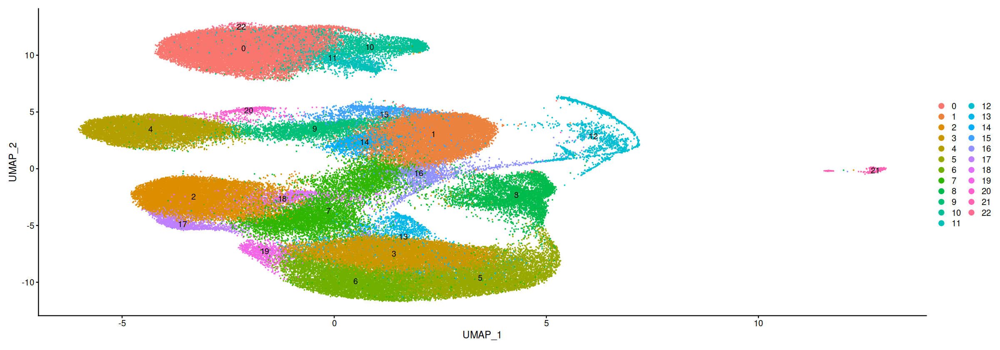

In [5]:
DimPlot(new_dia_cd8, label = T, raster = F)

In [6]:
DefaultAssay(new_dia_cd8)  <- "RNA"

In [7]:
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.8)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 110969
Number of edges: 2904908

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8755
Number of communities: 20
Elapsed time: 59 seconds


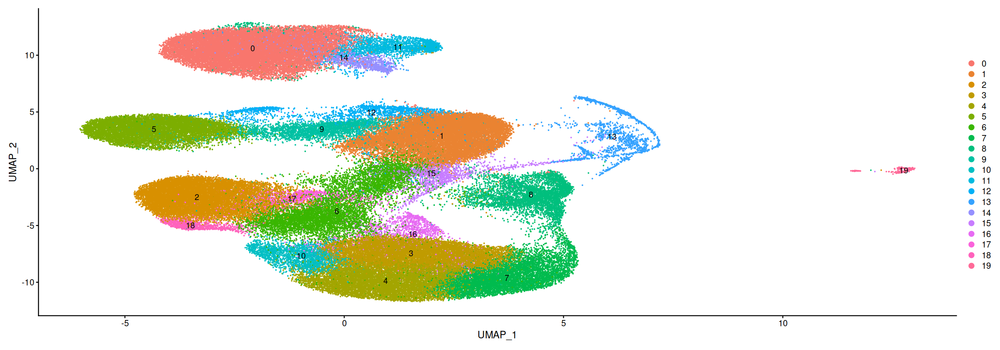

In [8]:
DimPlot(new_dia_cd8, label = T, raster = F)

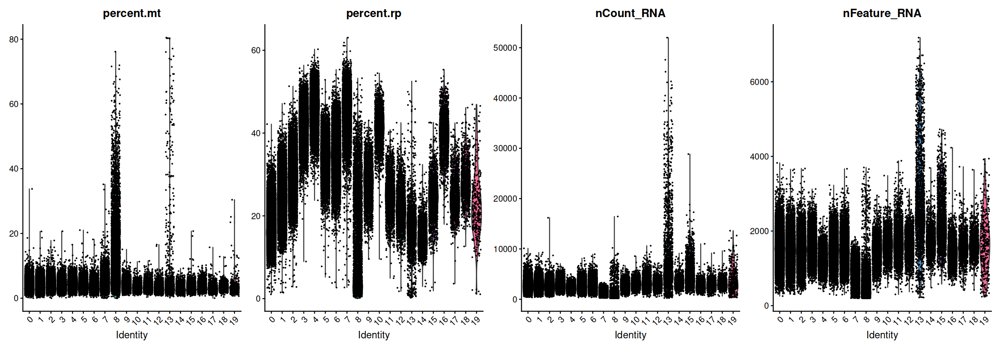

In [9]:
VlnPlot(new_dia_cd8, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4, raster = F)

### Remove dead and contaminating cells

In [10]:
cutoff_nFeature_RNA <- 500
cutoff_percent_mt <- 10
cluster_exclude  <- c(8,19)

Warning message in geom_hline(yintercept = cutoff_percent_mt, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"
Warning message in geom_hline(yintercept = cutoff_nFeature_RNA, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"


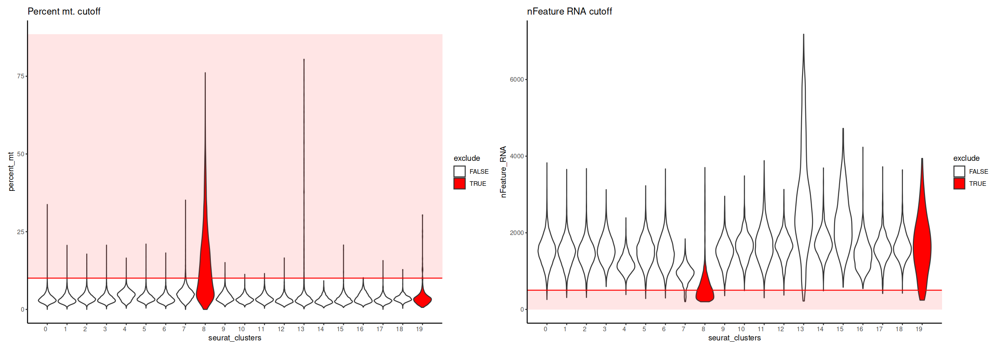

In [11]:
p1 <- ggplot(data.frame(nCount_RNA = new_dia_cd8$nCount_RNA,
                  nFeature_RNA = new_dia_cd8$nFeature_RNA,
                  percent_mt = new_dia_cd8$percent.mt,
                  seurat_clusters = new_dia_cd8$seurat_clusters,
                  exclude = ifelse(new_dia_cd8$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = percent_mt)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_percent_mt,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("Percent mt. cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd8$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd8$seurat_clusters))+1, 
           ymin=cutoff_percent_mt,ymax=1.1*(max(new_dia_cd8$percent.mt)), fill = "red", alpha = 0.1)

p2 <- ggplot(data.frame(nCount_RNA = new_dia_cd8$nCount_RNA,
                  nFeature_RNA = new_dia_cd8$nFeature_RNA,
                  percent_mt = new_dia_cd8$percent.mt,
                  seurat_clusters = new_dia_cd8$seurat_clusters,
                        exclude = ifelse(new_dia_cd8$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = nFeature_RNA)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_nFeature_RNA,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("nFeature RNA cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd8$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd8$seurat_clusters))+1, 
           ymin=0, ymax=cutoff_nFeature_RNA, fill = "red", alpha = 0.1)



p1 + p2

In [12]:
new_dia_cd8  <- subset(new_dia_cd8, 
                       ((seurat_clusters %in% cluster_exclude) == F) &
                      percent.mt < cutoff_percent_mt &
                      nFeature_RNA > cutoff_nFeature_RNA)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from ref.umap_ to refumap_"


In [13]:
new_dia_cd8 <- NormalizeData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- ScaleData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- FindVariableFeatures(new_dia_cd8, nfeatures = 800, verbose = FALSE)
new_dia_cd8 <- RunPCA(new_dia_cd8, npcs = 12, verbose = FALSE)
new_dia_cd8 <- RunUMAP(new_dia_cd8, reduction = "pca", dims = 1:12)
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 1)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
21:47:15 UMAP embedding parameters a = 0.9922 b = 1.112

21:47:15 Read 104812 rows and found 12 numeric columns

21:47:15 Using Annoy for neighbor search, n_neighbors = 30

21:47:15 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:47:25 Writing NN index file to temp file /var/tmp/pbs.18232159.meta-pbs.metacentrum.cz/Rtmp2ASn0O/file2b04b6430966

21:47:25 Searching Annoy index using 1 thread, search_k = 3000

21:48:11 Annoy recall = 100%

21:48:12 Commencing smooth kNN distance calibratio

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 104812
Number of edges: 2696314

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8513
Number of communities: 18
Elapsed time: 48 seconds


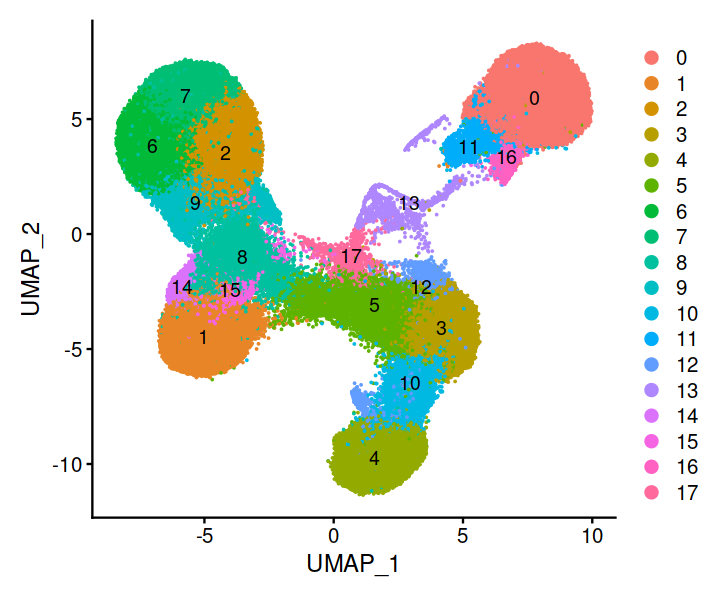

In [14]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd8, label = T, raster = F)

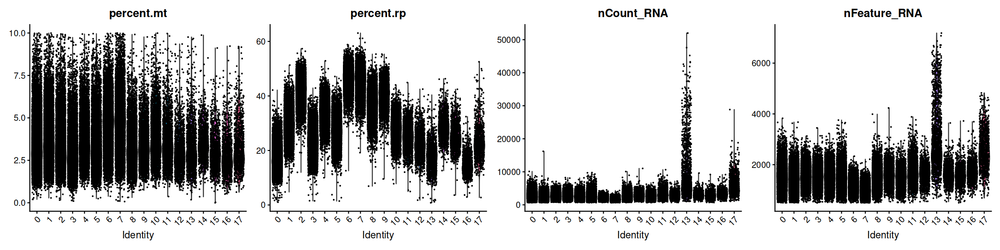

In [15]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd8, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4, raster = F)

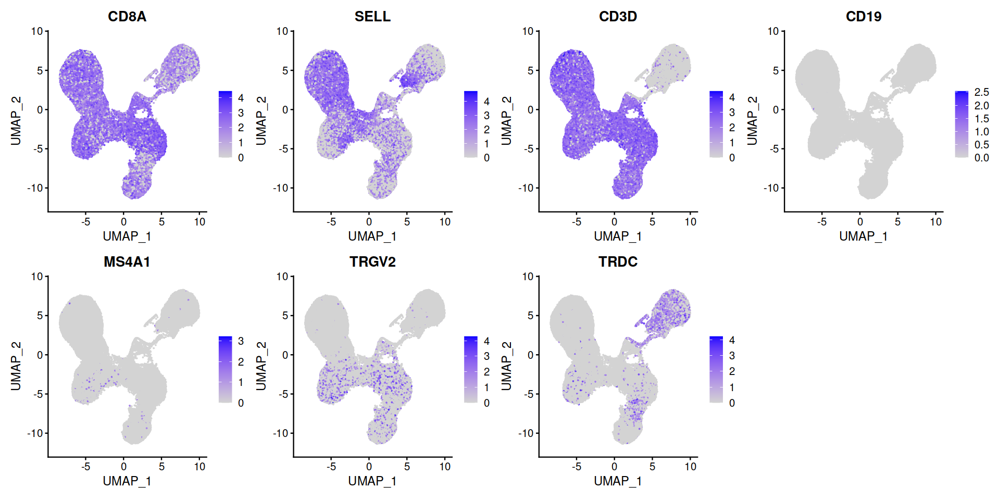

In [16]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd8, features = c("CD8A", "SELL", "CD3D", "CD19", "MS4A1", "TRGV2", "TRDC"), ncol = 4, raster = F)

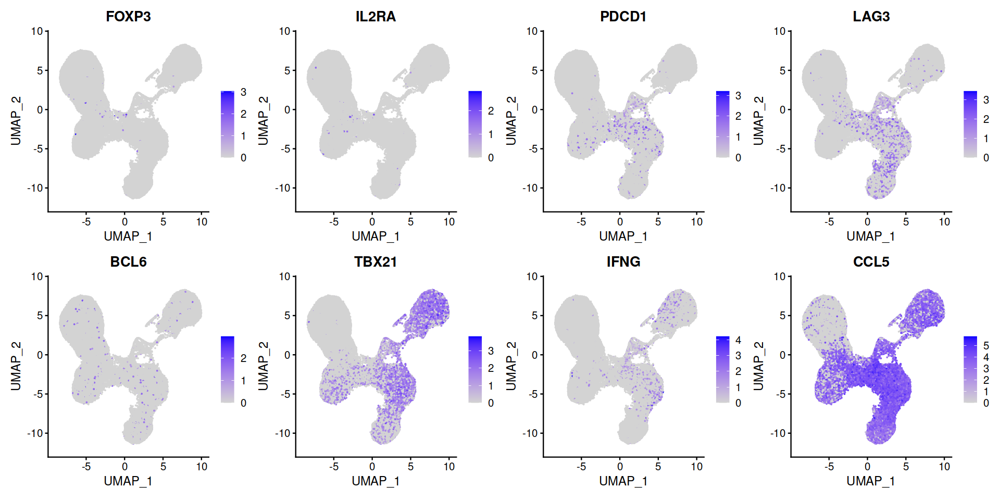

In [17]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd8, features = c("FOXP3", "IL2RA", "PDCD1", "LAG3", "BCL6", "TBX21", "IFNG", "CCL5"), ncol = 4, raster = F)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 104812
Number of edges: 2696314

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8885
Number of communities: 14
Elapsed time: 42 seconds


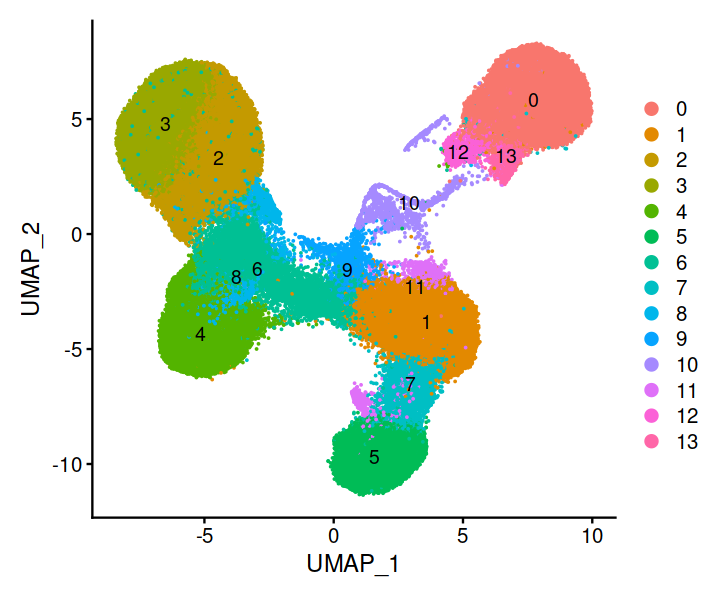

In [18]:
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.6)

options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd8, label = T, raster = F)

### PCA on samples

In [19]:
new_dia_cd8@meta.data  <- new_dia_cd8@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

In [20]:
new_dia_cd8$Sample_char  <- paste(new_dia_cd8$Patient_ID, 
                                  new_dia_cd8$Disease,
                                  new_dia_cd8$Time,
                                  new_dia_cd8$Age_group,
                                  new_dia_cd8$Sex,
                                  new_dia_cd8$Experiment_ID)

In [21]:
cd8_samples  <- AverageExpression(new_dia_cd8, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [22]:
cd8_samples  <- FindVariableFeatures(cd8_samples)

In [23]:
cd8_samples  <- RunPCA(cd8_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  RGS10, EIF3E, NPM1, BTF3, ST13, ALKBH7, LSM5, EIF3H, ANP32B, UQCRB 
	   PCBP2, OCIAD2, SARAF, FKBP1A, EEF1A1, C1QBP, PEBP1, LDLRAP1, IMPDH2, APEX1 
	   CCNI, LRRN3, ATP6V0E2, PLEKHB1, IFNGR2, NDFIP1, EIF2D, CLNS1A, PRKAR1B, TIMM9 
Negative:  ABHD17A, TGFB1, CAPNS1, PIP4K2A, AKT1, PREX1, KIAA2013, GNB1, CD81, GNAI2 
	   TRAPPC10, MAPK1, ARL8A, MAP2K2, FMNL1, EFHD2, STK39, ZNRF2, IQGAP1, UTRN 
	   CCDC92, TAF10, PTP4A2, ARHGAP26, GSK3A, QKI, SAP30L, BTBD6, CLPTM1L, RUNX3 
PC_ 2 
Positive:  AMMECR1L, WASH6P, MTRNR2L12, R3HDM2, USF2, AC007326.4, C17orf49, MOB2, PMS2, ZBED6 
	   MAP1LC3B2, WDR83OS, DNAJC25-GNG10, CRYBB2, PRRG3, ENO3, RFLNB, RYBP, RBAK-RBAKDN, COL6A3 
	   PKD1, GALNT1, HIGD1A, NPRL3, AL117339.4, NDUFC2, VAMP2, AC013394.1, CTDNEP1, DAPL1 
Negative:  SNRPD3, AC010422.8, CSNK2B, KLRK1, RNASEK, AC091959.1, 

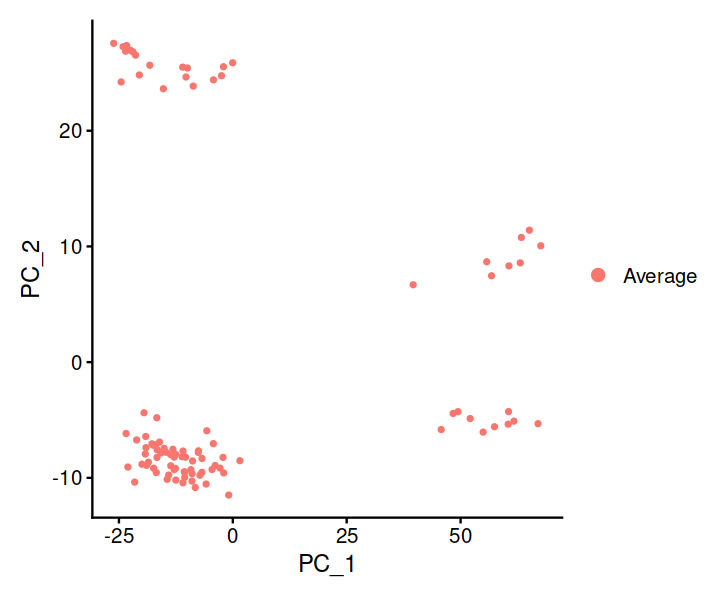

In [24]:
DimPlot(cd8_samples)

In [25]:
cd8_samples$Sample_char  <- colnames(cd8_samples)

In [26]:
cd8_samples$Sample_char  %>% table

.
    101 Dia T0 1 M Exp18     101 Dia T1 1 M Exp18     102 Dia T0 1 M Exp18 
                       1                        1                        1 
    102 Dia T1 1 M Exp18     103 Dia T0 2 M Exp18     103 Dia T1 2 M Exp18 
                       1                        1                        1 
    104 Dia T0 3 M Exp08     104 Dia T0 3 M Exp18     104 Dia T1 3 M Exp18 
                       1                        1                        1 
    105 Dia T0 1 M Exp08     105 Dia T0 1 M Exp18     105 Dia T1 1 M Exp18 
                       1                        1                        1 
    106 Dia T0 1 F Exp08     106 Dia T0 1 F Exp18     106 Dia T1 1 F Exp18 
                       1                        1                        1 
    107 Dia T0 1 M Exp11     107 Dia T0 1 M Exp18     107 Dia T1 1 M Exp18 
                       1                        1                        1 
    108 Dia T0 2 F Exp08     108 Dia T0 2 F Exp18     108 Dia T1 2 F Exp18 
          

In [27]:
cd8_samples@meta.data  <- cd8_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

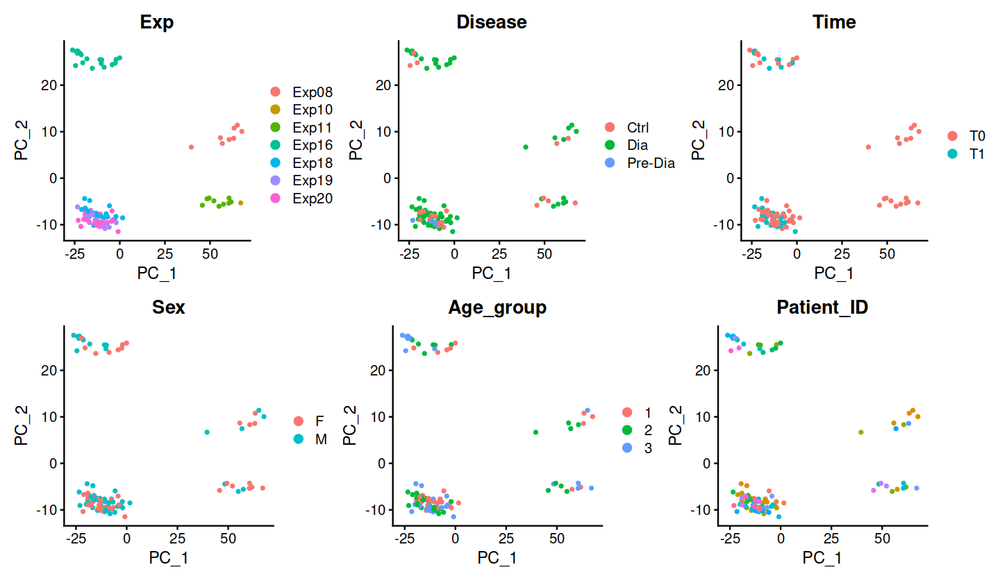

In [28]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd8_samples, group.by = "Exp") + DimPlot(cd8_samples, group.by = "Disease") + DimPlot(cd8_samples, group.by = "Time")) / (DimPlot(cd8_samples, group.by = "Sex") + DimPlot(cd8_samples, group.by = "Age_group") + (DimPlot(cd8_samples, group.by = "Patient_ID") + NoLegend()))

In [29]:
p1  <- (DimPlot(cd8_samples, group.by = "Exp") + DimPlot(cd8_samples, group.by = "Disease") + DimPlot(cd8_samples, group.by = "Time")) / (DimPlot(cd8_samples, group.by = "Sex") + DimPlot(cd8_samples, group.by = "Age_group") + (DimPlot(cd8_samples, group.by = "Patient_ID") + NoLegend()))

## STACAS Integration over Experiment

In [30]:
new_dia_experiment  <- SplitObject(new_dia_cd8, split.by = "Experiment_ID")

In [31]:
new_dia_experiment

$Exp08
An object of class Seurat 
30413 features across 7048 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3
 4 dimensional reductions calculated: pca, umap, integrated_dr, ref.umap

$Exp10
An object of class Seurat 
30413 features across 651 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3
 4 dimensional reductions calculated: pca, umap, integrated_dr, ref.umap

$Exp11
An object of class Seurat 
30413 features across 9615 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.cell

In [32]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = new_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 800)
})

library(STACAS)

new_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:12) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 2.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.6 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 6

Merging dataset 4 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 7 into 6 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 6 4 7

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 3

Extracting anchors for merged samples

Finding 

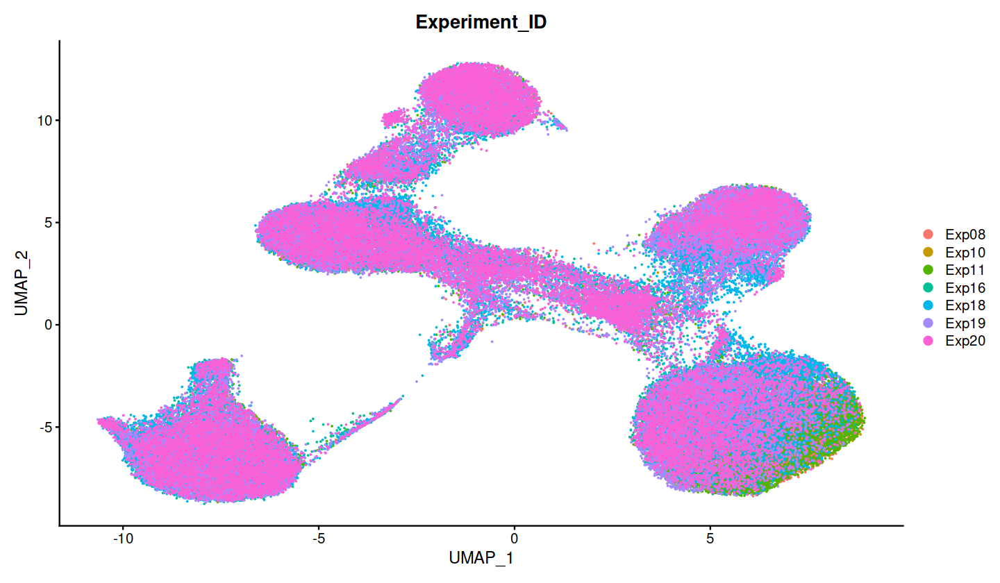

In [33]:
# Visualize
DimPlot(new_dia_experiment, group.by = c("Experiment_ID"), raster=F)

### PCA on samples

In [34]:
cd8_samples2  <- AverageExpression(new_dia_experiment, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [35]:
cd8_samples2  <- FindVariableFeatures(cd8_samples2)

In [36]:
cd8_samples2  <- RunPCA(cd8_samples2)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  MYO1F, IQGAP1, ACTN4, PYHIN1, ADAM8, STOM, IQGAP2, KLRD1, SLAMF7, CST7 
	   TBX21, SPN, RAP1GAP2, FLNA, TLN1, NKG7, UTRN, NFATC2, GK5, MSN 
	   TGFBR3, SYNE2, PTPN18, SRGN, FGR, APMAP, PIK3AP1, S1PR5, LCP1, ATP2B4 
Negative:  LDHB, RGS10, ACTN1, TRABD2A, ARMH1, LDLRAP1, A1BG, NELL2, DNPH1, BZW2 
	   AIF1, NPM1, MAL, CD248, LRRN3, NT5E, LEF1, OXNAD1, NAP1L1, BEX3 
	   TCF7, ABLIM1, IL6ST, NOG, RCAN3, AHCY, FOXP1, SPINT2, SERINC5, ANP32B 
PC_ 2 
Positive:  CYBA, C1orf162, TRBC1, CATSPER1, CXCR2, SIGLEC7, RASSF4, NMUR1, CD247, AKR1C3 
	   ABI3, TMIGD2, WDR1, IGFBP7, FCER1G, MLC1, TBXAS1, FEZ1, ADAMTS1, SH2D1B 
	   ARPC5, GSTP1, PLEKHF1, RHOBTB3, ALOX5AP, SYK, GSTM2, MMP23B, SERPINB1, GSN 
Negative:  MAP3K1, SOCS3, RTKN2, RELB, ZNF683, TIAM1, C4orf48, ANK1, TRGV10, ANXA5 
	   EZR, PPP2R5C, ARID5B, MYADM, FXYD1, GPR15,

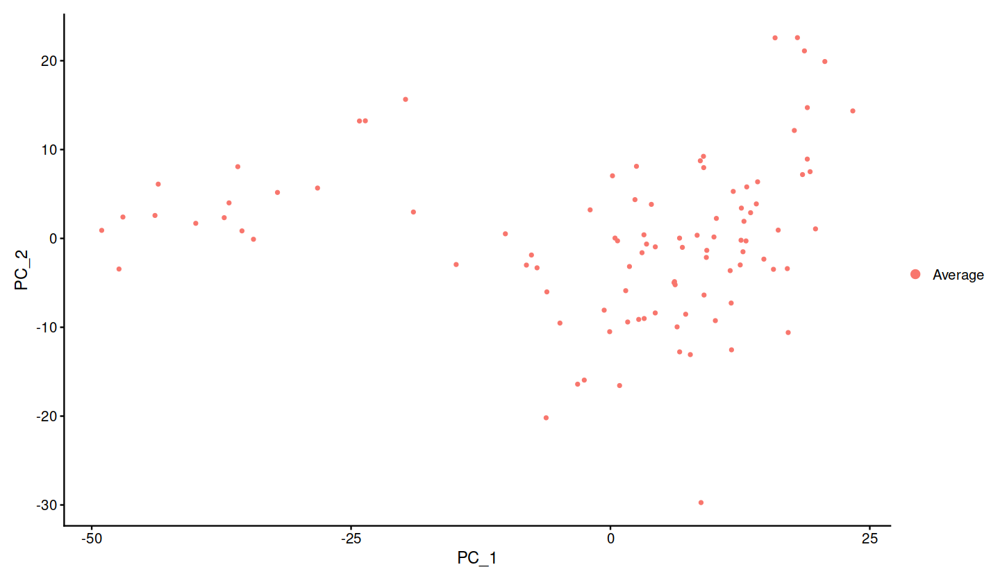

In [37]:
DimPlot(cd8_samples2)

In [38]:
cd8_samples2$Sample_char  <- colnames(cd8_samples2)

In [39]:
cd8_samples2@meta.data  <- cd8_samples2@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

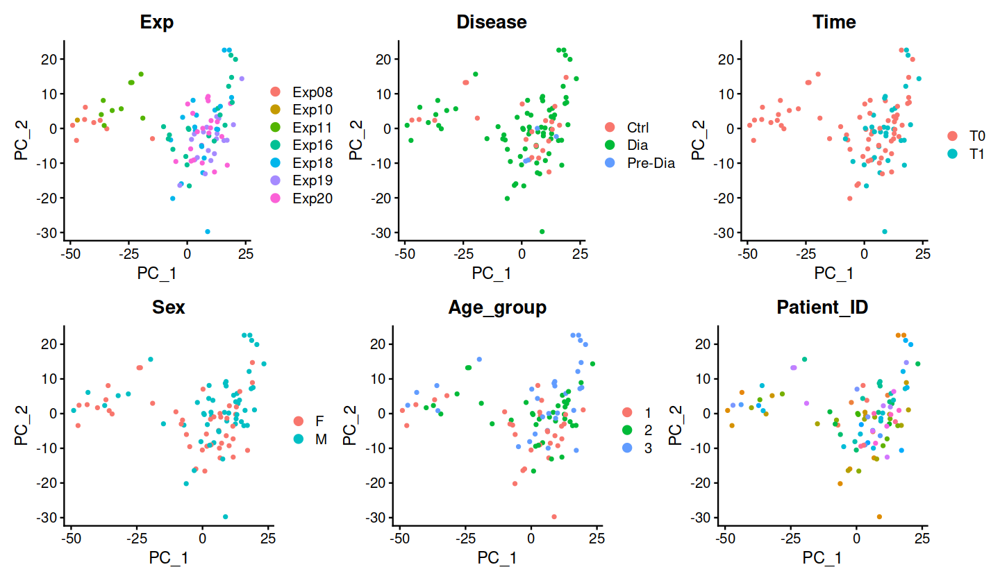

In [40]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd8_samples2, group.by = "Exp") + DimPlot(cd8_samples2, group.by = "Disease") + DimPlot(cd8_samples2, group.by = "Time")) / 
(DimPlot(cd8_samples2, group.by = "Sex") + DimPlot(cd8_samples2, group.by = "Age_group") + (DimPlot(cd8_samples2, group.by = "Patient_ID") + NoLegend()))

In [41]:
p2  <- (DimPlot(cd8_samples2, group.by = "Exp") + DimPlot(cd8_samples2, group.by = "Disease") + DimPlot(cd8_samples2, group.by = "Time")) / 
(DimPlot(cd8_samples2, group.by = "Sex") + DimPlot(cd8_samples2, group.by = "Age_group") + (DimPlot(cd8_samples2, group.by = "Patient_ID") + NoLegend()))

In [42]:
p3  <-  p1  + plot_annotation(title = 'CD8',
                                           subtitle = 'PCA no integration',
                              theme = theme(plot.title = element_text(size = 12))) & ggtheme()

In [43]:
p4  <- p2 + plot_annotation(title = "CD8", subtitle = 'PCA integration STACAS', 
                              theme = theme(plot.title = element_text(size = 10))) & ggtheme()

In [44]:
plot2  <- cowplot::plot_grid(p3,p4, ncol = 1)

In [45]:
ggsave(filename="01_PCA_integration_CD8.pdf", 
       plot = plot2, 
       device = cairo_pdf, 
       width = 210, 
       height = 297, 
       units = "mm")

# Add metadata

In [46]:
md_dia  <- read_xlsx("data/metadata3.xlsx")

In [47]:
md_dia  %>% colnames

[1] "patient"                     "rc"                         
 [3] "dat_nar"                     "matched_dataset_manual"     
 [5] "matched_group_manual"        "matched_dataset_propensity" 
 [7] "matched_group_propensity"    "time_taken"                 
 [9] "age_taken"                   "Patient_Time"               
[11] "age_group"                   "sex"                        
[13] "dat_man"                     "age_man"                    
[15] "hba1c_man"                   "ph_man"                     
[17] "ahco3_man"                   "random_cpeptide_man"        
[19] "bh_man"                      "bh_man_sds"                 
[21] "bw_man"                      "bw_man_sds"                 
[23] "bmi_man"                     "bmi_man_sds"                
[25] "gad_man"                     "iaa_man"                    
[27] "ia2_man"                     "znt8_man"                   
[29] "date_taken_1"                "fasting_cpept_1"            
[31] "wbc"                         "lymph_abs"                  
[33] "mon_abs"                     "neutr_abs"                  
[35] "eoz_abs"                     "baz_abs"                    
[37] "lymph_perc"                  "mon_perc"                   
[39] "neutr_perc"                  "eoz_perc"                   
[41] "baz_perc"                    "tdd_1"                      
[43] "tdd_per_kg_1"                "fasting_cpept_T1"           
[45] "HLA_A1"                      "HLA_A2"                     
[47] "HLA_B1"                      "HLA_B2"                     
[49] "HLA_C1"                      "HLA_C2"                     
[51] "HLA_DMA1"                    "HLA_DMA2"                   
[53] "HLA_DMB1"                    "HLA_DMB2"                   
[55] "HLA_DOA1"                    "HLA_DOA2"                   
[57] "HLA_DPA11"                   "HLA_DPA12"                  
[59] "HLA_DPB11"                   "HLA_DPB12"                  
[61] "HLA_DQA11"                   "HLA_DQA12"                  
[63] "HLA_DQB11"                   "HLA_DQB12"                  
[65] "HLA_DRA1"                    "HLA_DRA2"                   
[67] "HLA_DRB11"                   "HLA_DRB12"                  
[69] "HLA_E1"                      "HLA_E2"                     
[71] "HLA_F1"                      "HLA_F2"                     
[73] "sample"                      "pct_CD8_of_live"            
[75] "pct_naive_of_CD8"            "pct_eff_of_CD8"             
[77] "pct_CD4_of_live"             "pct_naive_of_CD4"           
[79] "pct_eff_of_CD4"              "sort_ratio_naive_to_eff_CD8"
[81] "sort_ratio_naive_to_eff_CD4"

In [48]:
md_seurat  <- new_dia_experiment@meta.data

In [51]:
md_seurat   <- md_seurat  %>% mutate(Patient_Time = paste(Patient_ID, Time))

In [52]:
md_joined  <- left_join(md_seurat, md_dia)

Joining with `by = join_by(Patient_Time)`


In [53]:
new_dia_experiment@meta.data  <- md_joined
rownames(new_dia_experiment@meta.data)  <- colnames(new_dia_experiment)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



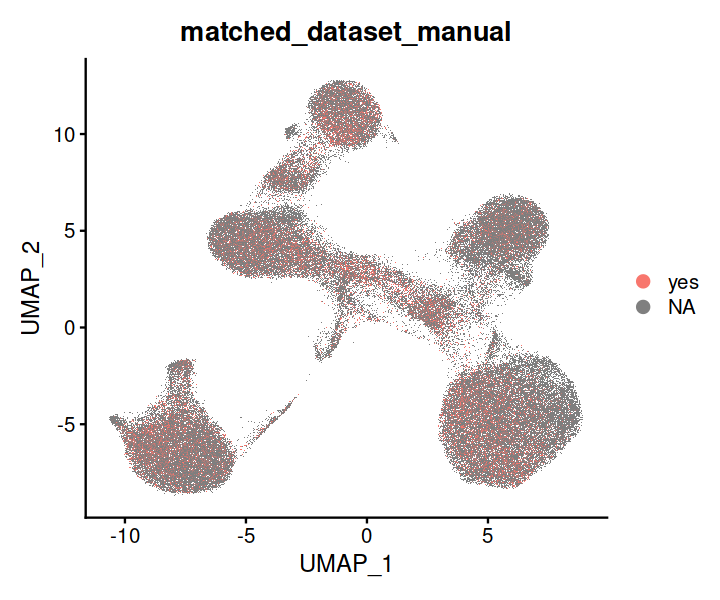

In [54]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_experiment, group.by = "matched_dataset_manual", raster = T)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



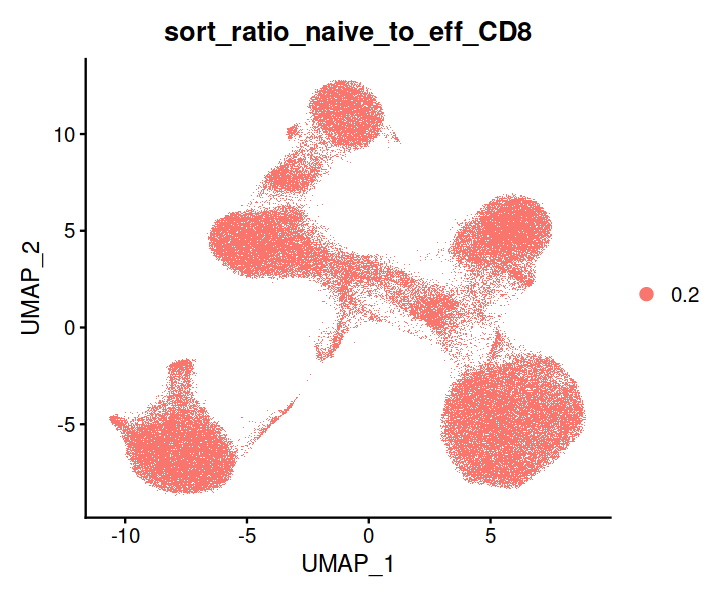

In [55]:
DimPlot(new_dia_experiment, group.by = "sort_ratio_naive_to_eff_CD8", raster = T)

In [ ]:
saveRDS(new_dia_experiment, "data/processed/cd8_full_filt.rds")

# Analysis CD8 Level 1

In [56]:
new_dia_cd8 <- FindNeighbors(new_dia_experiment, dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [57]:
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 104812
Number of edges: 2875022

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8980
Number of communities: 16
Elapsed time: 50 seconds


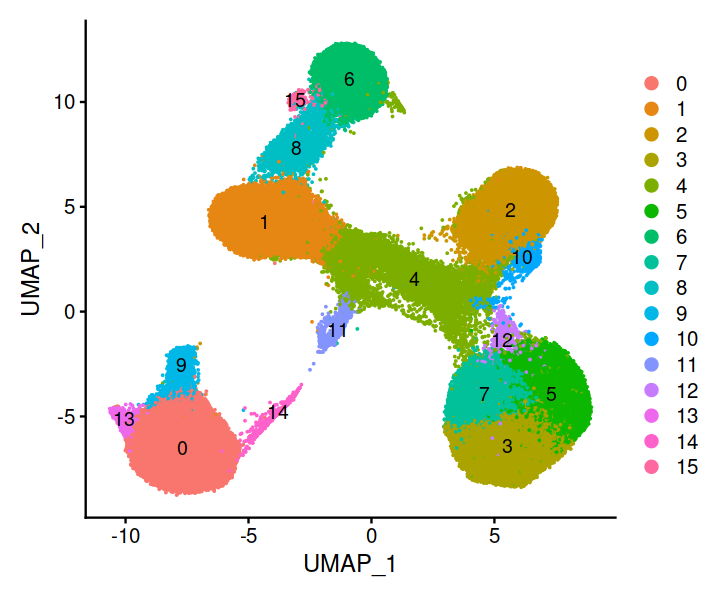

In [58]:
options(repr.plot.width=6, repr.plot.height=5)

DimPlot(new_dia_cd8, label = T, raster = F)

In [59]:
new_dia_cd8@meta.data  <- new_dia_cd8@meta.data  %>% 
mutate(annotations_l1 = recode_factor(seurat_clusters, 
                                     "0" = "NK cells",
                                     "1" = "CD8 T cells",
                                     "2" = "CD8 T cells",
                                     "3" = "CD8 T cells",
                                     "4" = "CD8 T cells",
                                     "5" = "CD8 T cells",
                                     "6" = "Unconventional T cells",
                                     "7" = "CD8 T cells",
                                     "8" = "Unconventional T cells",
                                     "9" = "NK cells",
                                     "10" = "CD8 T cells",
                                     "11" = "CD8 T cells",
                                     "12" = "CD8 T cells",
                                     "13" = "NK cells",
                                     "14" = "NK cells",
                                     "15" = "Unconventional T cells"
                                     ))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



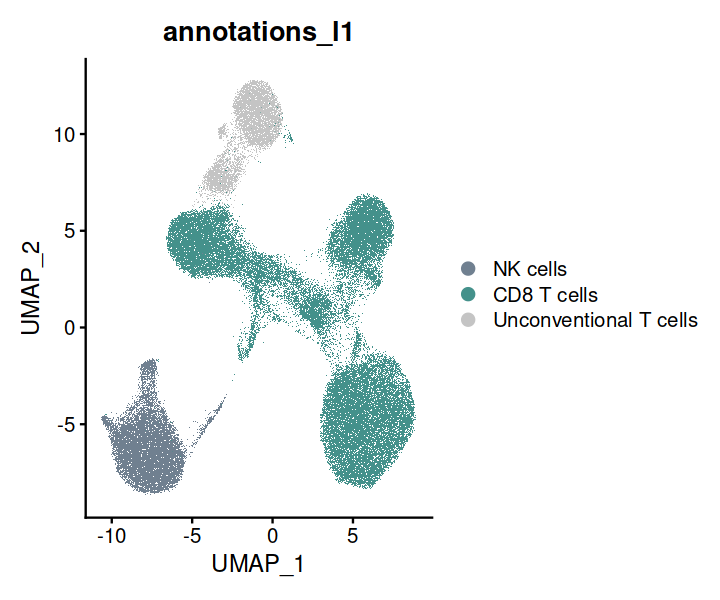

In [63]:
DimPlot(new_dia_cd8, raster = T, group.by = "annotations_l1",
       cols = c("slategrey","#44918b",  "grey77"))

In [61]:
saveRDS(new_dia_cd8, "data/processed/cd8_full_filt.rds")

# Analysis CD8 Level 2

## Analysis CD8 Level 2: Conventional CD8+ T cells

In [ ]:
new_dia_cd8  <- readRDS("data/processed/cd8_full_filt.rds")

In [90]:
merged.list  <- SplitObject(subset(new_dia_cd8, annotations_l1 == "CD8 T cells"), split.by = "Experiment_ID")

In [91]:
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

In [92]:
new_dia_experiment2 <- Run.STACAS(merged.list, dims = 1:14)
new_dia_experiment2 <- RunUMAP(new_dia_experiment2, dims = 1:14) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.3 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 4 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 4 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 7 into 5 6 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 3 into 5 6 4 7

Extracting anchors for merged samples

Finding integration vectors

Finding integrati

In [93]:
cd8_subcluster  <- new_dia_experiment2

In [94]:
cd8_subcluster <- FindNeighbors(cd8_subcluster, reduction = "pca", dims = 1:14)

Computing nearest neighbor graph

Computing SNN



In [17]:
cd8_subcluster <- FindClusters(cd8_subcluster, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 69770
Number of edges: 1906540

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8611
Number of communities: 11
Elapsed time: 22 seconds


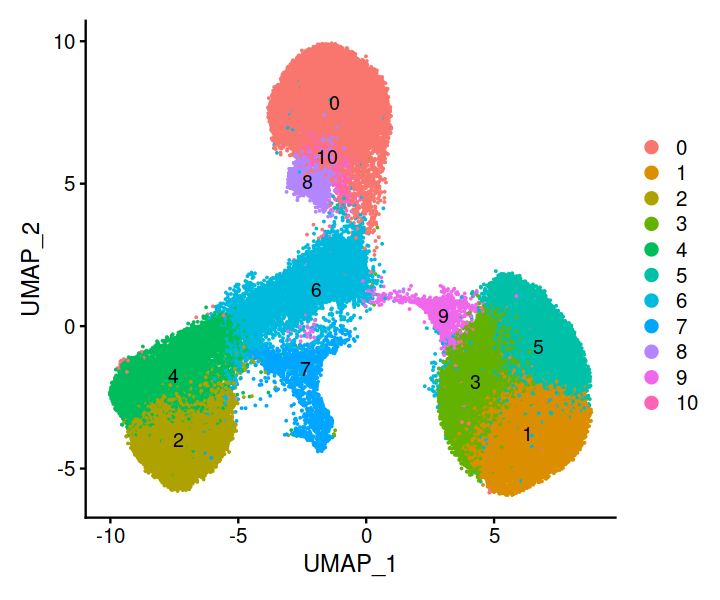

In [18]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(cd8_subcluster, label = T)

In [19]:
cd8_subcluster@meta.data  <- cd8_subcluster@meta.data  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, 
                                      "0" = "Tem",
                                     "1" = "Naive",
                                     "2" = "Temra 1",
                                     "3" = "Naive",
                                     "4" = "Temra 2",
                                     "5" = "Naive",
                                     "6" = "Tcm",
                                     "7" = "Proliferating",
                                    "8" = "Tem ISAGhi",                                    
                                     "9" = "Naive ISAGhi",                                    
                                     "10" = "Tem"                                    
                                     ))

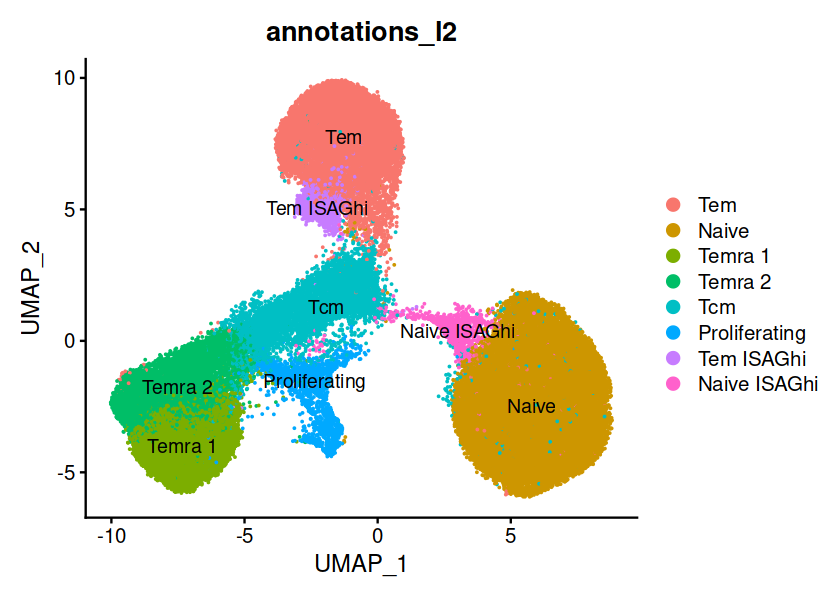

In [20]:
options(repr.plot.width = 7, repr.plot.height = 5)

DimPlot(cd8_subcluster, label = T, group.by = "annotations_l2")

In [64]:
saveRDS(cd8_subcluster, "data/processed/cd8_subcluster.rds")

## Annotations for figures

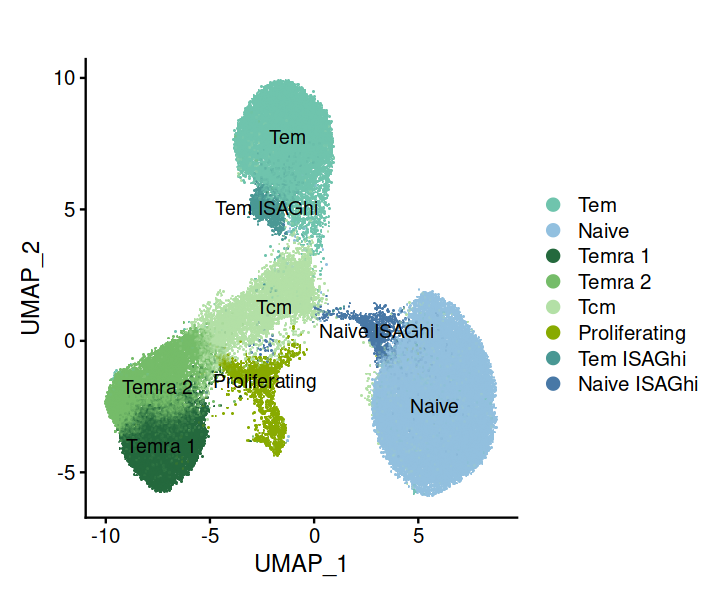

In [60]:
DimPlot(cd8_subcluster, label = T, group.by = "annotations_l2", 
    cols = c(cd8_subcluster@misc$cols_annotations_l2), 
    raster = T, pt.size = 2) + ggtitle("")

In [59]:
cd8_subcluster@misc$cols_annotations_l2  <- c(
     "#6FC4AD", # Tcm2 
     "#92c0df", #Naive
     "#24693d", # TEM ISAGhi
     "#75bc69",  # Tem
     "#b3e0a6" , # Tcm1
     "#88aa00" , # Proliferating
     "#499894", # Temra 
     "#4878a6")

In [3]:
cd8_subcluster  <- readRDS("data/processed/cd8_subcluster.rds")

In [24]:
plan("multisession")

In [25]:
mrk  <- FindAllMarkers(cd8_subcluster, logfc.threshold = log(1.5))

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10



In [26]:
write.csv(mrk, "markers_cd8_full.csv")

In [27]:
Idents(cd8_subcluster)  <- cd8_subcluster$annotations_l2

In [28]:
mrk  <- FindAllMarkers(cd8_subcluster, logfc.threshold = log(1.5))

Calculating cluster Tem

Calculating cluster Naive

Calculating cluster Temra 1

Calculating cluster Temra 2

Calculating cluster Tcm

Calculating cluster Proliferating

Calculating cluster Tem ISAGhi

Calculating cluster Naive ISAGhi



In [29]:
write.csv(mrk, "markers_cd8_full_annot_l2.csv")

In [30]:
Idents(cd8_subcluster)  <- cd8_subcluster$Disease

mrk  <- FindAllMarkers(subset(cd8_subcluster, Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & 
                              Time == "T0" &
                              Disease %in% c("Dia", "Ctrl")), only.pos = T)

write.csv(mrk, "markers_cd8_dia_vs_hd_t0.csv")

Calculating cluster Dia

Calculating cluster Ctrl



### Cluster tree

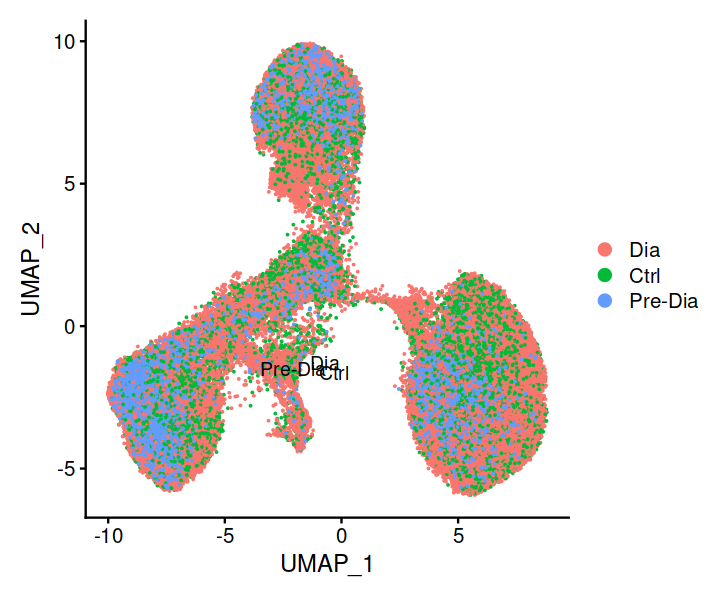

In [53]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(cd8_subcluster, label = T)

In [109]:
cd8_subcluster <- BuildClusterTree(
  cd8_subcluster,
  dims = 1:12,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [110]:
tree <- cd8_subcluster@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [111]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(color = (scales::hue_pal() (15)), shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

ERROR: Error in loadNamespace(name): there is no package called 'ggtree'


In [ ]:
options(repr.plot.width=3.5, repr.plot.height=3)
p

## Analysis CD8 Level 2: NK cells

In [33]:
new_dia_cd8  <- readRDS("data//processed//cd8_full_filt.rds")

In [34]:
merged.list  <- SplitObject(subset(new_dia_cd8, annotations_l1 == "NK cells"), split.by = "Experiment_ID")

In [35]:
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -1.842"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.30103"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  6.0478e-15"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.31041"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  8.7896e-05"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.31041"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.0093753"
Warning message in 

In [36]:
new_dia_experiment2 <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment2 <- RunUMAP(new_dia_experiment2, dims = 1:12) 

Excluding 1 datasets with < 100 cells

You may alter this behavior by setting the min.sample.size parameter

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -1.842"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.30103"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  6.0478e-15"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 4

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 4 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 4 3 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weight

In [37]:
nk_subcluster  <- new_dia_experiment2

In [38]:
nk_subcluster <- FindNeighbors(nk_subcluster, reduction = "pca", dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [39]:
nk_subcluster <- FindClusters(nk_subcluster, resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22667
Number of edges: 596058

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7880
Number of communities: 9
Elapsed time: 4 seconds


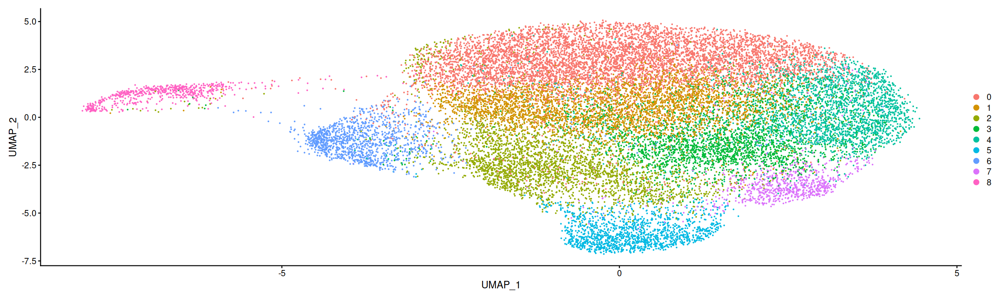

In [40]:
DimPlot(nk_subcluster)

In [41]:
mrk  <- FindAllMarkers(nk_subcluster, logfc.threshold = log(1.5))

write.csv(mrk, "markers_nk_subcluster.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



In [42]:
saveRDS(nk_subcluster, "data/processed/nk_subcluster.rds")

In [ ]:
nk_subcluster  <- readRDS("data/processed/nk_subcluster.rds")

## Analysis CD8 Level 2: Unconventional cells

In [43]:
merged.list  <- SplitObject(subset(new_dia_cd8, annotations_l1 == "Unconventional T cells"), split.by = "Experiment_ID")

In [44]:
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -1.4793"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.31796"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  2.1577e-28"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"There are other near singularities as well. 0.090619"


In [45]:
new_dia_experiment2 <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment2 <- RunUMAP(new_dia_experiment2, dims = 1:12)

Excluding 1 datasets with < 100 cells

You may alter this behavior by setting the min.sample.size parameter

Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 6 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 5 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 6 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 5 6 3 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 5 6 3 4 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Centering and scaling data matrix

PC_ 1 


In [46]:
unc_subcluster  <- new_dia_experiment2

In [47]:
unc_subcluster <- FindNeighbors(unc_subcluster, reduction = "pca", dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [48]:
unc_subcluster <- FindClusters(unc_subcluster, resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12344
Number of edges: 362138

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7951
Number of communities: 6
Elapsed time: 1 seconds


In [8]:
options(repr.plot.width=3.5, repr.plot.height=3)

DimPlot(unc_subcluster, label = T)

ERROR: Error in is(x, "classRepresentation"): object 'unc_subcluster' not found


In [51]:
mrk  <- FindAllMarkers(unc_subcluster, logfc.threshold = log(1.5))

write.csv(mrk, "markers_unc_subcluster.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



In [52]:
saveRDS(unc_subcluster, "data/processed/unc_subcluster.rds")

In [159]:
unc_subcluster  <- readRDS("data/processed/unc_subcluster.rds")

# Analysis CD8 Level 3

In [ ]:
DimPlot(cd8_subcluster, label = T)

## Analysis CD8 Level 3: Teff

In [9]:
cd8_subcluster  <- readRDS("data/processed/cd8_subcluster.rds")

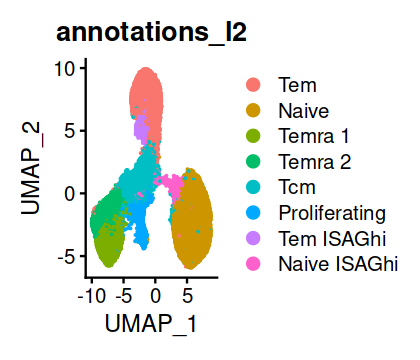

In [10]:
DimPlot(cd8_subcluster, group.by = 'annotations_l2')

In [ ]:
teff <- subset(cd8_subcluster, seurat_clusters %in% c(3,5,6,7,8,10,12,14))

In [ ]:
teff

In [ ]:
teff_dia_experiment  <- SplitObject(teff, split.by = "Experiment_ID")

In [ ]:
teff_dia_experiment

In [ ]:
plan("sequential")

In [ ]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = teff_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 500)
})

library(STACAS)

teff_dia_experiment <- Run.STACAS(merged.list, dims = 1:10)
teff_dia_experiment <- RunUMAP(teff_dia_experiment, dims = 1:10) 

In [ ]:
# Visualize

DimPlot(teff_dia_experiment)

In [ ]:
teff_dia_experiment  <- FindNeighbors(teff_dia_experiment)
teff_dia_experiment  <- FindClusters(teff_dia_experiment, resolution = 0.5)

In [ ]:
saveRDS(teff_dia_experiment, "data/processed/cd8_subcluster_teff.rds")